In [1]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LATITUDE_FORMATTER, LONGITUDE_FORMATTER
import cftime
import datetime
from datetime import date
from matplotlib import pyplot
from matplotlib import colors
from matplotlib import font_manager
from matplotlib.cm import ScalarMappable
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
import numpy
import pandas
from PIL import Image
import random
import xarray as xr

In [2]:
Diri = '/glade/u/home/whimkao//ExtraTrack/ExtraTrack_Data/Output_Files_V6/'
NetCDF_Diri = '/glade/derecho/scratch/whimkao/NetCDF_Files_V6/'
Output_Diri = '/glade/u/home/whimkao//ExtraTrack/ExtraTrack_Github/RCP_Figs/Analysis_Figs_V6.6.2/'

In [3]:
# Open File
def Open_File(File):
    DF = pandas.read_csv(File)
    DF = DF.drop("Unnamed: 0", axis=1)
    return (DF)

In [4]:
# Open Each File
def Files_Open(Model, Diri, Subset):
    Data_DF = Open_File(Diri+Model+'_Data_'+Subset+'_Output_V6.csv')
    ET_DF = Open_File(Diri+Model+'_ET_'+Subset+'_Output_V6.csv')
    Codes_DF = Open_File(Diri+Model+'_Codes_Output_V6.csv')
# Edit Time Format
    Time, Begin_Time, Compl_Time, Trop_Peak_Time, Peak_Time, Birth_Time = [], [], [], [], [], []
    for i in range(len(Data_DF)):
        Time.append(Datetime(Data_DF["Time(Z)"][i]))
    for j in range(len(ET_DF)):
        Begin_Time.append(Datetime(ET_DF["ET Begin Time"][j]))
        Compl_Time.append(Datetime(ET_DF["ET Complete Time"][j]))
        Trop_Peak_Time.append(Datetime(ET_DF["Trop Peak Time"][j]))
        Peak_Time.append(Datetime(ET_DF["Peak Time"][j]))
        Birth_Time.append(Datetime(ET_DF["Genesis Time"][j]))
    Data_DF["Time(Z)"] = Time
    ET_DF["ET Begin Time"] = Begin_Time
    ET_DF["ET Complete Time"] = Compl_Time
    ET_DF["Trop Peak Time"] = Trop_Peak_Time
    ET_DF["Peak Time"] = Peak_Time
    ET_DF["Genesis Time"] = Birth_Time
    return (Data_DF, ET_DF, Codes_DF)

In [5]:
def Datetime(Time):
    try:
        New_Time = datetime.datetime.strptime(Time, '%Y-%m-%d %H:%M:%S')
    except:
        New_Time = numpy.nan
    return (New_Time)

In [6]:
# Create Phase Distribution Bins
def Create_Bins(Min, Max, Bin_Width):
    Bins = numpy.arange(Min, Max+Bin_Width, Bin_Width)
    return (Bins)
Lat_Bins = Create_Bins(10,60,5)
Lon_Bins = Create_Bins(-100,20,5)

In [7]:
Num_Years = numpy.array([90,93,93])

In [8]:
# Function to Find Distance Between Two Points
def Find_Distance(y1, y2, x1, x2):
    Start_Lat = y1 * numpy.pi / 180
    End_Lat = y2 * numpy.pi / 180
    Start_Lon = x1 * numpy.pi / 180
    End_Lon = x2 * numpy.pi / 180
    Lat_Diff = End_Lat - Start_Lat
    Lon_Diff = End_Lon - Start_Lon
    Earth_Rad = 6378
    Distance = 2 * Earth_Rad * numpy.sqrt((numpy.sin(Lat_Diff/2))**2 + \
    numpy.cos(Start_Lat) * numpy.cos(End_Lat) * (numpy.sin(Lon_Diff/2))**2)
    return (Distance)

In [9]:
# Find a Specific Storm Within the DataFrame
def Find_Storm(DF, Code):
    DF_Storm = DF[DF["Code"] == Code].reset_index()
    return (DF_Storm)

In [10]:
Control_Data, Control_ET, Control_Codes = Files_Open("Control", Diri, "SubsetB")
RCP45_Data, RCP45_ET, RCP45_Codes = Files_Open("RCP45", Diri, "SubsetB")
RCP85_Data, RCP85_ET, RCP85_Codes = Files_Open("RCP85", Diri, "SubsetB")

In [11]:
Months_Name = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Jun-Aug', 'Sep-Nov', 'Dec-May', 'Annual']

In [12]:
# Create Function to Open Monthly Files
def Open_Monthly_File(Model):
    DS_Dict = {}
    for i in range(len(Months_Name)):
        File_Name = str(Model+'_Output_'+Months_Name[i]+'_V6.nc')
        Month_DS = xr.open_dataset(NetCDF_Diri + File_Name)
        DS_Dict[Months_Name[i]] = Month_DS
        print (i)
    return (DS_Dict)

In [13]:
# Open Monthly Files
Control_DS_Dict = Open_Monthly_File("Control")
RCP45_DS_Dict = Open_Monthly_File("RCP45")
RCP85_DS_Dict = Open_Monthly_File("RCP85")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15


In [14]:
Control_DS_Dict['Sep-Nov']

<xarray.Dataset> Size: 2MB
Dimensions:  (plev: 13, lat: 61, lon: 101)
Coordinates:
  * lat      (lat) float64 488B 0.0 1.0 2.0 3.0 4.0 ... 56.0 57.0 58.0 59.0 60.0
  * lon      (lon) float64 808B -100.0 -99.0 -98.0 -97.0 ... -3.0 -2.0 -1.0 0.0
  * plev     (plev) float64 104B 1e+05 9.25e+04 8.5e+04 ... 1.5e+04 1e+04 5e+03
Data variables:
    T        (plev, lat, lon) float32 320kB ...
    TS       (lat, lon) float32 25kB ...
    Z3       (plev, lat, lon) float32 320kB ...
    PSL      (lat, lon) float32 25kB ...
    U        (plev, lat, lon) float32 320kB ...
    V        (plev, lat, lon) float32 320kB ...
    FLUT     (lat, lon) float32 25kB ...
    TMQ      (lat, lon) float32 25kB ...
    OMEGA    (plev, lat, lon) float32 320kB ...
    OCNFRAC  (lat, lon) float32 25kB ...

In [15]:
# Create Function For Plotting Contour Maps of Variables
def Variable_Contour_Plot(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Colours, Diff_Bounds, Diff_Colours, Line_Bounds, Label, Label_Unit, Diff_Plot, Ocean_Only, Savefig, Figname):
# Create Fig
    Fig = pyplot.figure(figsize=(18,20))
#
# Produce Dataset
    for i in range(len(Months)):
        Month = Months[i]
        if Var == 'PSL' or Var == 'TMQ' or Var == 'FLUT':
            Control_DS_Var = Control_DS_Dict[Month].sel(lon=slice(-100,-15), lat=slice(0,60))[Var]
            RCP45_DS_Var = RCP45_DS_Dict[Month].sel(lon=slice(-100,-15), lat=slice(0,60))[Var]
            RCP85_DS_Var = RCP85_DS_Dict[Month].sel(lon=slice(-100,-15), lat=slice(0,60))[Var]
        else:
            Control_DS_Var = Control_DS_Dict[Month].sel(plev=Plev, lon=slice(-100,-15), lat=slice(0,60))[Var]
            RCP45_DS_Var = RCP45_DS_Dict[Month].sel(plev=Plev, lon=slice(-100,-15), lat=slice(0,60))[Var]
            RCP85_DS_Var = RCP85_DS_Dict[Month].sel(plev=Plev, lon=slice(-100,-15), lat=slice(0,60))[Var]
#
# Mask Out Land Surface
        if Ocean_Only == True:
            Control_DS_Var = Control_DS_Var.where(Control_DS_Dict[Month]['OCNFRAC'] >= 0.5)
            RCP45_DS_Var = RCP45_DS_Var.where(RCP45_DS_Dict[Month]['OCNFRAC'] >= 0.5)
            RCP85_DS_Var = RCP85_DS_Var.where(RCP85_DS_Dict[Month]['OCNFRAC'] >= 0.5)
#
# Calculate Differences
        RCP45_DS_Var_Diff = RCP45_DS_Var - Control_DS_Var
        RCP85_DS_Var_Diff = RCP85_DS_Var - Control_DS_Var
#
# Plot Control
        Axis = Fig.add_subplot(4,3,i+1, projection=ccrs.PlateCarree())
        Plot_Contour_Map(Axis, Control_DS_Var, Bounds, Colours)
        Plot_Formatting(Axis, Var, str("Control (" + Month + ")"))
        Letter_Label(Axis, i)
#
# Colour Bar
        if i == 1:
            C_Map = mcolors.LinearSegmentedColormap.from_list(Var, Colours, N=len(Colours))
            if Var == 'TS' or Var == 'T':
                Bounds_Norm = Bounds-273.15
            elif Var == 'PSL':
                Bounds_Norm = Bounds/100
            else:
                Bounds_Norm = Bounds
            Norm = mcolors.BoundaryNorm(Bounds_Norm, C_Map.N, extend='both')
            Cax = Axis.inset_axes([0.02, -0.10, 0.96, 0.02], transform=Axis.transAxes)
            Fig.colorbar(ScalarMappable(cmap=C_Map, norm=Norm), orientation='horizontal', \
            cax=Cax, label=str(Label+" "+Label_Unit), shrink=0.7)
#
# Plot RCP4.5 or RCP4.5-Control
        Axis = Fig.add_subplot(4,3,i+4, projection=ccrs.PlateCarree())
        if Diff_Plot == False:
            Plot_Contour_Map(Axis, RCP45_DS_Var, Bounds, Colours)
            Plot_Formatting(Axis, Var, str("RCP4.5 (" + Month + ")"))
        else:
            Plot_Contour_Map(Axis, RCP45_DS_Var_Diff, Diff_Bounds, Diff_Colours)
            Plot_Formatting(Axis, Var, str("RCP4.5 - Control (" + Month + ")"))
#
# Colour Bar For Diff Plots
            if i == 1:
                C_Map = mcolors.LinearSegmentedColormap.from_list(Var, Diff_Colours, N=len(Diff_Colours))
                if Var == 'PSL':
                    Diff_Bounds_Norm = Diff_Bounds/100
                else:
                    Diff_Bounds_Norm = Diff_Bounds
                Norm = mcolors.BoundaryNorm(Diff_Bounds_Norm, C_Map.N, extend='both')
                Cax = Axis.inset_axes([0.02, -0.10, 0.96, 0.02], transform=Axis.transAxes)
                Fig.colorbar(ScalarMappable(cmap=C_Map, norm=Norm), orientation='horizontal', \
                cax=Cax, label=str(Label+" Difference "+Label_Unit), shrink=0.7)
        Letter_Label(Axis, i+3)
#
# Plot RCP8.5 or RCP8.5-Control
        Axis = Fig.add_subplot(4,3,i+7, projection=ccrs.PlateCarree())
        if Diff_Plot == False:
            Plot_Contour_Map(Axis, RCP85_DS_Var, Bounds, Colours)
            Plot_Formatting(Axis, Var, str("RCP8.5 (" + Month + ")"))
        else:
            Plot_Contour_Map(Axis, RCP85_DS_Var_Diff, Diff_Bounds, Diff_Colours)
            Plot_Formatting(Axis, Var, str("RCP8.5 - Control (" + Month + ")"))
        Letter_Label(Axis, i+6)
#
# Plot Contour Lines
        Axis = Fig.add_subplot(4,3,i+10, projection=ccrs.PlateCarree())
        Plot_Contour_Lines(Axis, Control_DS_Var, Var, Line_Bounds, 'limegreen')
        Plot_Contour_Lines(Axis, RCP45_DS_Var, Var, Line_Bounds, 'darkorange')
        Plot_Contour_Lines(Axis, RCP85_DS_Var, Var, Line_Bounds, 'red')
        Plot_Formatting(Axis, Var, str(Label + " (" + Month + ")"))
        Letter_Label(Axis, i+9)
        Add_Legend(Axis, i, 1, 1)
# 
# Save Fig
    Fig.tight_layout()
    if Savefig == True:
        Fig.savefig(Output_Diri+Figname, bbox_inches='tight')

In [16]:
# Plotting Contour Map
def Plot_Contour_Map(Axis, DS, Bounds, Colours):
    pyplot.contourf(DS['lon'], DS['lat'], DS, levels=Bounds, colors=Colours, extend='both')

In [17]:
# Plotting Contour Map
def Plot_Contour_Lines(Axis, DS, Var, Bounds, Colour):
    if Var == 'TS' or Var == 'T':
        DS_Contour = DS - 273.15
        FMT = "%2.0f"
    elif Var == 'PSL':
        DS_Contour = DS / 100
        FMT = "%4.0f"
    elif Var == 'Z3':
        DS_Contour = DS
        FMT = "%4.0f"
    else:
        DS_Contour = DS
        FMT = "%3.0f"
    Contours = Axis.contour(DS_Contour['lon'], DS_Contour['lat'], DS_Contour, levels=Bounds, colors=Colour, \
    linestyles=['solid', 'dashed', 'dotted'])
    Axis.clabel(Contours, fmt=FMT, fontsize=10)

In [18]:
# Formatting
def Plot_Formatting(Axis, Var, Title):
    Axis.coastlines(linewidth=0.5)
    Axis.add_feature(cfeature.BORDERS, linewidth=0.5)
    Axis.add_feature(cfeature.STATES, linewidth=0.3)
    x_Min, x_Max, y_Min, y_Max = -100, -15, 0, 60
    x_Axis = Create_Bins(x_Min, x_Max, 10)
    y_Axis = Create_Bins(y_Min, y_Max, 10)
    Axis.set_xticks(x_Axis)
    Axis.set_yticks(y_Axis)
    Axis.set_xlim(x_Min,x_Max)
    Axis.set_ylim(y_Min,y_Max)
    Axis.set_title(Title, fontsize=18)
    Gridline = Axis.grid(linewidth=0.3, color='silver', linestyle='-')

In [19]:
# Add Legend
def Add_Legend(Axis, i, i_Loc, Loc):
    if i == i_Loc:
        Axis.plot([-728,-728], [-728,-728], c='limegreen', label='Control')
        Axis.plot([-728,-728], [-728,-728], c='darkorange', label='RCP4.5')
        Axis.plot([-728,-728], [-728,-728], c='red', label='RCP8.5')
        pyplot.legend(loc=Loc, fontsize=15)

In [20]:
# Create Function For Plotting Contour Lines of Eady Growth Rate
def Variable_Contour_Line(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Label, Ocean_Only, Savefig, Figname):
# Create Fig
    if len(Months) == 4:
        Fig = pyplot.figure(figsize=(15,11))
    elif len(Months) == 12:
        Fig = pyplot.figure(figsize=(18,18))
#
# Produce Dataset
    for i in range(len(Months)):
        Month = Months[i]
        if Var == 'PSL' or Var == 'TMQ' or Var == 'FLUT':
            Control_DS_Var = Control_DS_Dict[Month].sel(lon=slice(-100,-15), lat=slice(0,60))[Var]
            RCP45_DS_Var = RCP45_DS_Dict[Month].sel(lon=slice(-100,-15), lat=slice(0,60))[Var]
            RCP85_DS_Var = RCP85_DS_Dict[Month].sel(lon=slice(-100,-15), lat=slice(0,60))[Var]
        else:
            Control_DS_Var = Control_DS_Dict[Month].sel(plev=Plev, lon=slice(-100,-15), lat=slice(0,60))[Var]
            RCP45_DS_Var = RCP45_DS_Dict[Month].sel(plev=Plev, lon=slice(-100,-15), lat=slice(0,60))[Var]
            RCP85_DS_Var = RCP85_DS_Dict[Month].sel(plev=Plev, lon=slice(-100,-15), lat=slice(0,60))[Var]
#
# Mask Out Land Surface
        if Ocean_Only == True:
            Control_DS_Var = Control_DS_Var.where(Control_DS_Dict[Month]['OCNFRAC'] >= 0.5)
            RCP45_DS_Var = RCP45_DS_Var.where(RCP45_DS_Dict[Month]['OCNFRAC'] >= 0.5)
            RCP85_DS_Var = RCP85_DS_Var.where(RCP85_DS_Dict[Month]['OCNFRAC'] >= 0.5)
#
# Plot Contour Lines
        if len(Months) == 4:
            Axis = Fig.add_subplot(2,2,i+1, projection=ccrs.PlateCarree())
        elif len(Months) == 12:
            Axis = Fig.add_subplot(4,3,i+1, projection=ccrs.PlateCarree())
        Plot_Contour_Lines(Axis, Control_DS_Var, Var, Bounds, 'limegreen')
        Plot_Contour_Lines(Axis, RCP45_DS_Var, Var, Bounds, 'darkorange')
        Plot_Contour_Lines(Axis, RCP85_DS_Var, Var, Bounds, 'red')
        Plot_Formatting(Axis, Var, str(Label + " (" + Month + ")"))
# Add Legend
        if len(Months) == 4:
            Add_Legend(Axis, i, 1, 1)
        elif len(Months) == 12:
            Add_Legend(Axis, i, 4, 1)
# Letter Labels
        Letter_Label(Axis, i)
#
# Save Fig
    Fig.tight_layout()
    if Savefig == True:
        Fig.savefig(Output_Diri+Figname, bbox_inches='tight')

In [21]:
# Define Colours and Bounds
# Sea Surface Temperature
Temp_Sfc_Colours = ['mediumblue', 'dodgerblue', 'deepskyblue', 'cyan', 'lightseagreen', 'limegreen', \
'greenyellow', 'yellow', 'gold', 'orange', 'darkorange', 'orangered', 'red', 'firebrick']
Temp_Sfc_Bounds_C = numpy.array([20,21,22,23,24,25,26,27,28,29,30,31,32])
Temp_Sfc_Bounds_K = Temp_Sfc_Bounds_C + 273.15
Temp_Sfc_Diff_Colours = ['mediumblue', 'dodgerblue', 'deepskyblue', 'cyan', 'white', \
'gold', 'orange', 'darkorange', 'orangered', 'red', 'firebrick']
Temp_Sfc_Diff_Bounds = numpy.array([-2,-1.5,-1,-0.5,0.5,1,1.5,2,2.5,3])
Temp_Sfc_Lines_Bounds = numpy.array([26,28,30])
#
# 850hPa Temperature
Temp_850hPa_Colours = ['mediumblue', 'dodgerblue', 'deepskyblue', 'cyan', 'lightseagreen', 'limegreen', \
'greenyellow', 'yellow', 'gold', 'orange', 'darkorange', 'orangered', 'red', 'firebrick']
Temp_850hPa_Bounds_C = Create_Bins(0,25,2.5)
Temp_850hPa_Bounds_K = Temp_850hPa_Bounds_C + 273.15
Temp_850hPa_Diff_Colours = ['mediumblue', 'dodgerblue', 'deepskyblue', 'cyan', 'white', \
'gold', 'orange', 'darkorange', 'orangered', 'red', 'firebrick']
Temp_850hPa_Diff_Bounds = numpy.array([-4,-3,-2,-1,1,2,3,4,5,6])
Temp_850hPa_Lines_Bounds = numpy.array([10,15,20])
#
# 500hPa Temperature
Temp_500hPa_Colours = ['mediumblue', 'dodgerblue', 'deepskyblue', 'cyan', 'lightseagreen', 'limegreen', \
'greenyellow', 'yellow', 'gold', 'orange', 'darkorange', 'orangered', 'red', 'firebrick']
Temp_500hPa_Bounds_C = Create_Bins(-30,0,2.5)
Temp_500hPa_Bounds_K = Temp_500hPa_Bounds_C + 273.15
Temp_500hPa_Diff_Colours = ['mediumblue', 'dodgerblue', 'deepskyblue', 'cyan', 'white', \
'gold', 'orange', 'darkorange', 'orangered', 'red', 'firebrick']
Temp_500hPa_Diff_Bounds = numpy.array([-4,-3,-2,-1,1,2,3,4,5,6])
Temp_500hPa_Lines_Bounds = numpy.array([-20,-15,-10])
#
# 500hPa Geopotential Height
Z_500hPa_Colours = ['mediumblue', 'dodgerblue', 'deepskyblue', 'cyan', 'lightseagreen', 'limegreen', \
'greenyellow', 'yellow', 'gold', 'orange', 'darkorange', 'orangered', 'red', 'firebrick']
Z_500hPa_Bounds = Create_Bins(5400,6000,50)
Z_500hPa_Diff_Colours = ['deepskyblue', 'cyan', 'white', 'gold', 'orange', 'darkorange', 'orangered', 'red', 'firebrick']
Z_500hPa_Diff_Bounds = numpy.array([-40,-20,20,40,60,80,100,120])
Z_500hPa_Lines_Bounds = numpy.array([5600,5800,6000])
#
# Sea Level Pressure
SLP_Colours = ['mediumblue', 'dodgerblue', 'deepskyblue', 'cyan', 'lightseagreen', 'limegreen', \
'greenyellow', 'yellow', 'gold', 'orange', 'darkorange', 'orangered', 'red', 'firebrick']
SLP_Bounds = Create_Bins(100000,102400,200)
SLP_Diff_Colours = ['mediumblue', 'dodgerblue', 'deepskyblue', 'cyan', 'white', \
'gold', 'orange', 'darkorange', 'orangered', 'red', 'firebrick']
SLP_Diff_Bounds = numpy.array([-200,-150,-100,-50,50,100,150,200,250,300])
SLP_Lines_Bounds = numpy.array([1016,1020,1024])
#
# 200hPa Zonal Wind
U_200hPa_Colours = ['red', 'darkorange', 'orange', 'gold', 'yellow', 'white', \
'greenyellow', 'limegreen', 'lightseagreen', 'deepskyblue', 'dodgerblue']
U_200hPa_Bounds = numpy.array([-40,-30,-20,-10,-2,2,10,20,30,40])
U_200hPa_Diff_Colours = ['red', 'darkorange', 'orange', 'gold', 'white', \
'lawngreen', 'limegreen', 'forestgreen', 'darkgreen']
U_200hPa_Diff_Bounds = numpy.array([-6,-4,-2,-1,1,2,4,6])
U_200hPa_Lines_Bounds = numpy.array([0,10,20])
#
# 850hPa Zonal Wind
U_850hPa_Colours = ['red', 'darkorange', 'orange', 'gold', 'yellow', 'white', \
'greenyellow', 'limegreen', 'lightseagreen', 'deepskyblue', 'dodgerblue']
U_850hPa_Bounds = numpy.array([-20,-15,-10,-5,-1,1,5,10,15,20])
U_850hPa_Diff_Colours = ['red', 'darkorange', 'orange', 'gold', 'white', \
'lawngreen', 'limegreen', 'forestgreen', 'darkgreen']
U_850hPa_Diff_Bounds = numpy.array([-3,-2,-1,-0.5,0.5,1,2,3])
U_850hPa_Lines_Bounds = numpy.array([0,5,10])

In [22]:
# Letter Labels
def Letter_Label(Axis, Plot):
    Fig_Labels = ['(a)','(b)','(c)','(d)', '(e)', '(f)', '(g)', '(h)', '(i)', '(j)', '(k)', '(l)']
    Axis.text(0.04, 0.95, str(Fig_Labels[int(Plot)]), ha='center', va='center', \
    transform=Axis.transAxes, fontdict={'size':18},color='black')

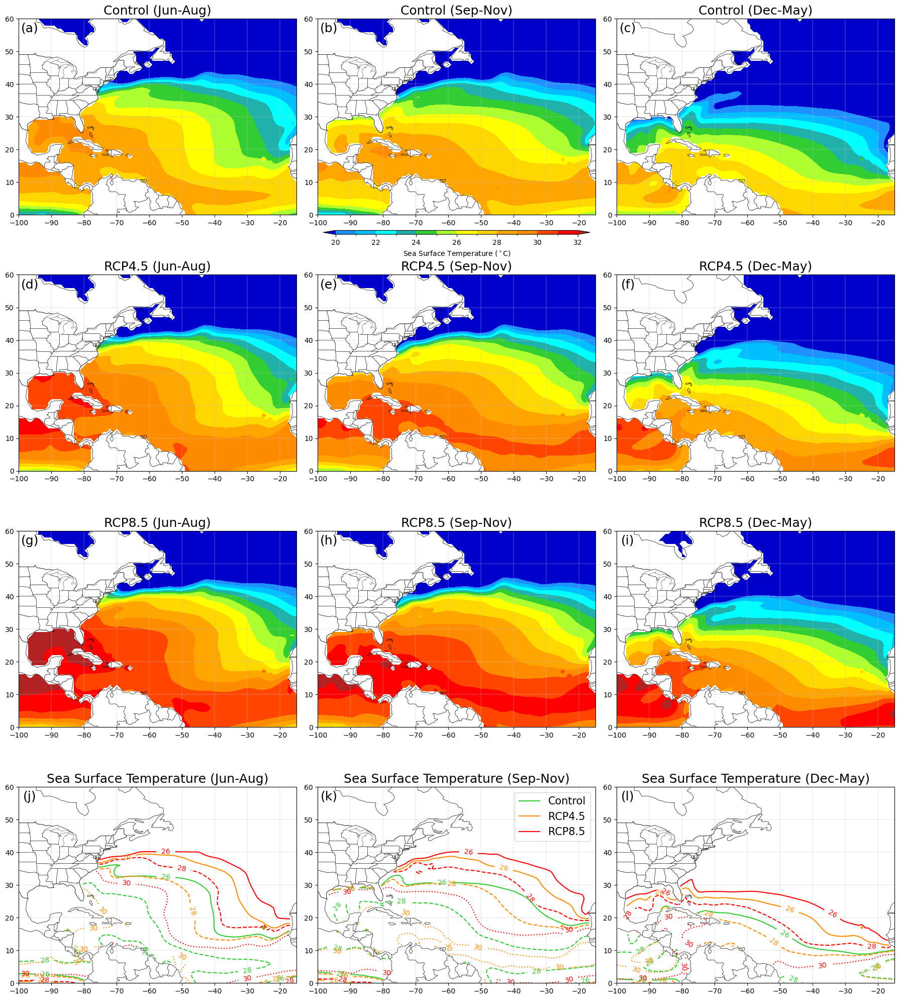

In [23]:
# Plot Sea Surface Temperature
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May']
Var = 'TS'
Plev = 100000
Bounds, Colours = Temp_Sfc_Bounds_K, Temp_Sfc_Colours
Diff_Bounds, Diff_Colours = Temp_Sfc_Diff_Bounds, Temp_Sfc_Diff_Colours
Line_Bounds = Temp_Sfc_Lines_Bounds
Label, Label_Unit = 'Sea Surface Temperature', '($^\circ$C)'
Diff_Plot = False
Ocean_Only = True
Savefig = True
Figname = 'Temp_Sfc_Seasons_Colours.png'
Variable_Contour_Plot(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Colours, Diff_Bounds, Diff_Colours, Line_Bounds, Label, Label_Unit, Diff_Plot, Ocean_Only, Savefig, Figname)

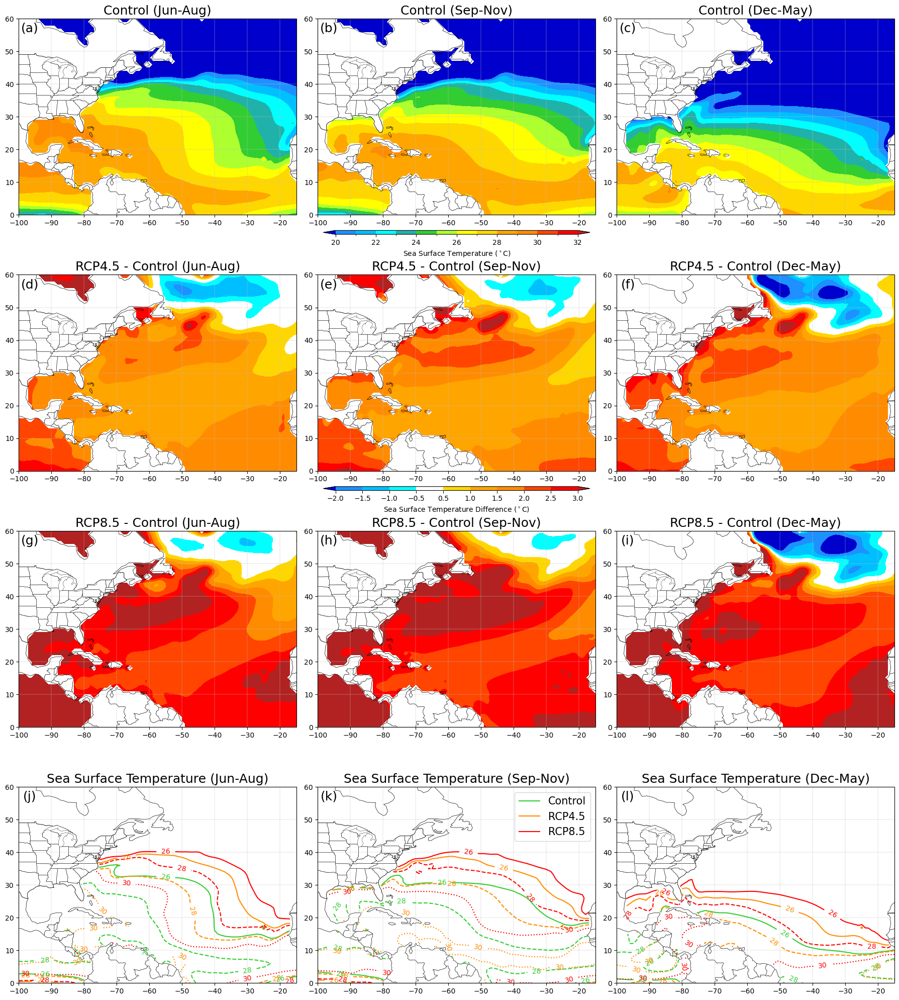

In [24]:
# Plot Sea Surface Temperature Differences
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May']
Var = 'TS'
Plev = 100000
Bounds, Colours = Temp_Sfc_Bounds_K, Temp_Sfc_Colours
Diff_Bounds, Diff_Colours = Temp_Sfc_Diff_Bounds, Temp_Sfc_Diff_Colours
Line_Bounds = Temp_Sfc_Lines_Bounds
Label, Label_Unit = 'Sea Surface Temperature', '($^\circ$C)'
Diff_Plot = True
Ocean_Only = True
Savefig = True
Figname = 'Temp_Sfc_Seasons_Diffs.png'
Variable_Contour_Plot(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Colours, Diff_Bounds, Diff_Colours, Line_Bounds, Label, Label_Unit, Diff_Plot, Ocean_Only, Savefig, Figname)

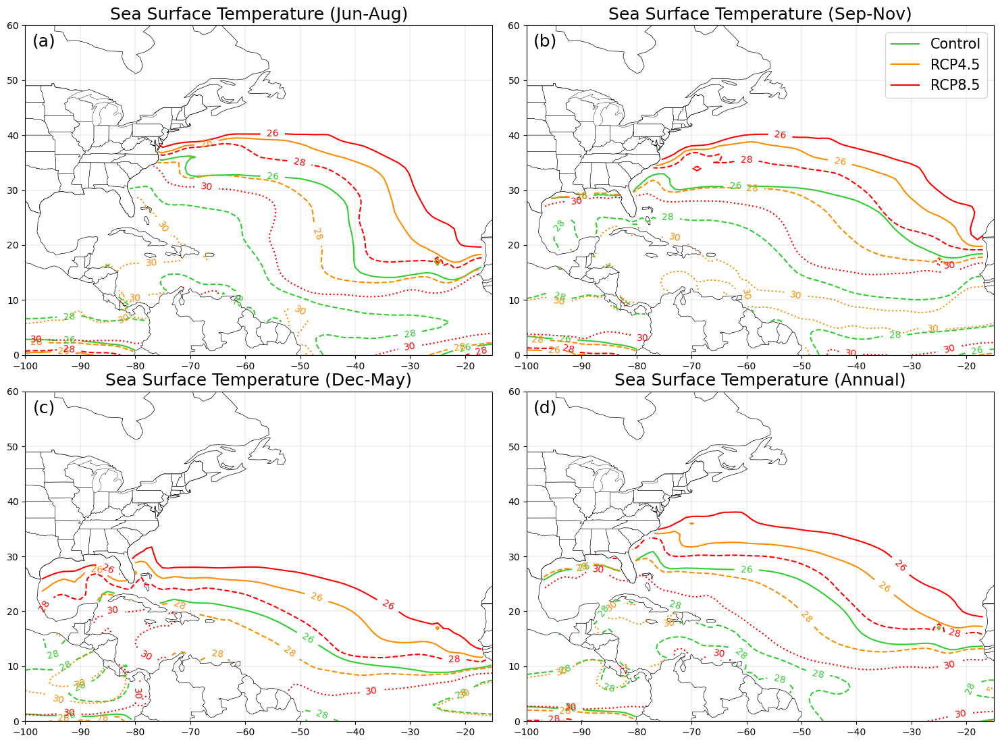

In [25]:
# Plot Sea Surface Temperature
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May', 'Annual']
Var = 'TS'
Plev = 100000
Bounds = Temp_Sfc_Lines_Bounds
Label = 'Sea Surface Temperature'
Ocean_Only = True
Savefig = True
Figname = 'Temp_Sfc_Seasons_Lines.png'
Variable_Contour_Line(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Label, Ocean_Only, Savefig, Figname)

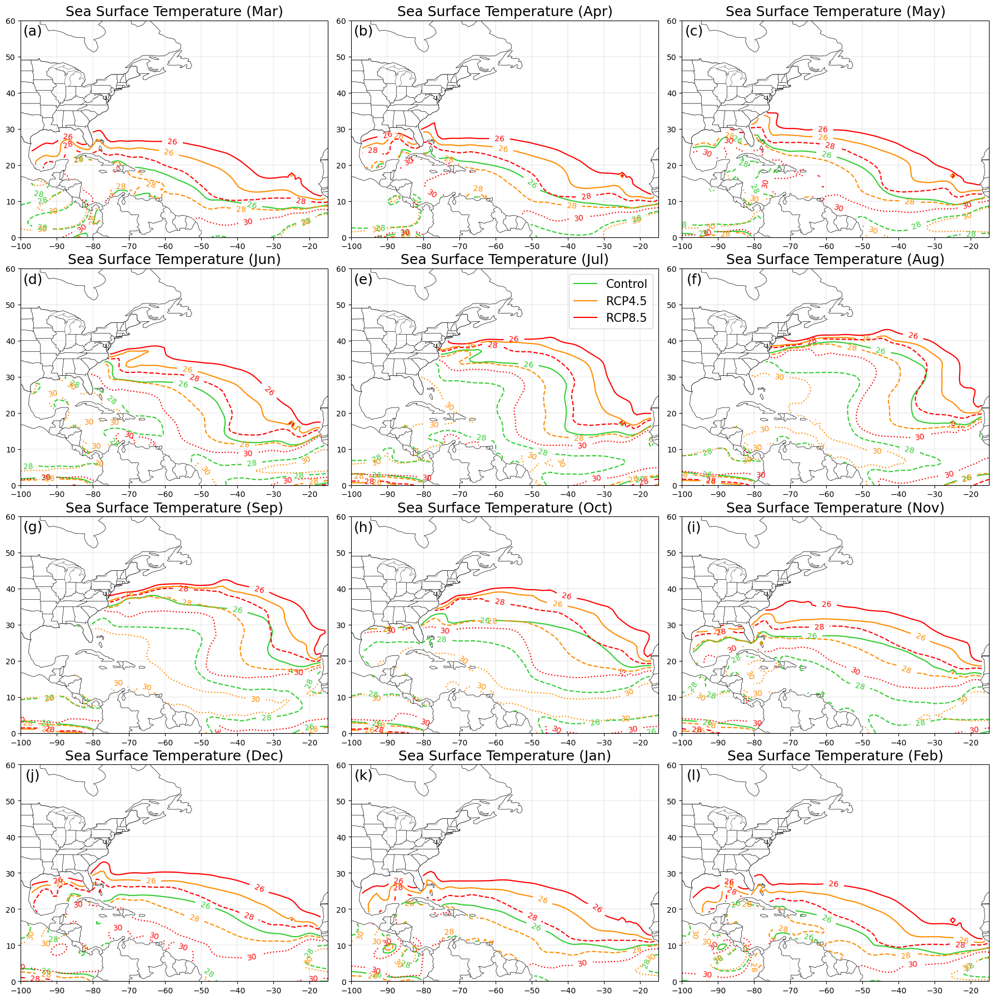

In [26]:
# Plot Sea Surface Temperature
Months = ['Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Jan', 'Feb']
Var = 'TS'
Plev = 100000
Bounds = Temp_Sfc_Lines_Bounds
Label = 'Sea Surface Temperature'
Ocean_Only = True
Savefig = True
Figname = 'Temp_Sfc_Months_Lines.png'
Variable_Contour_Line(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Label, Ocean_Only, Savefig, Figname)

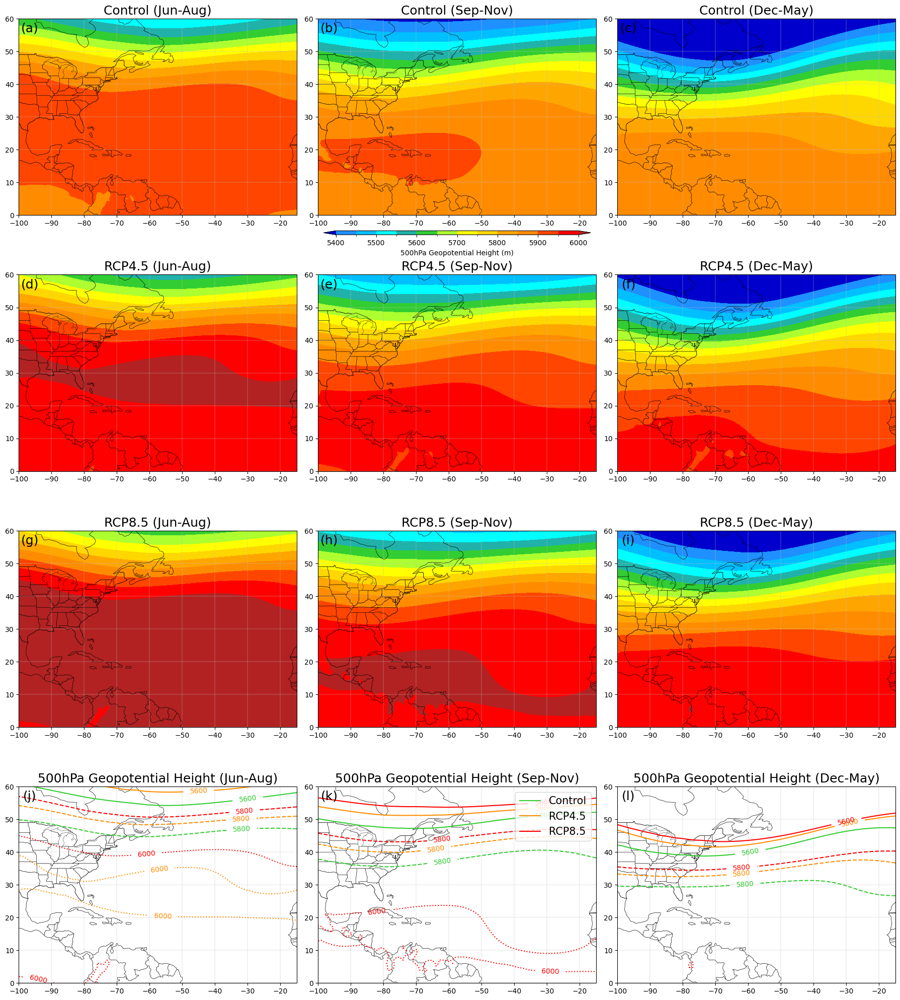

In [27]:
# Plot 500hPa Geopotential Height
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May']
Var = 'Z3'
Plev = 50000
Bounds, Colours = Z_500hPa_Bounds, Z_500hPa_Colours
Diff_Bounds, Diff_Colours = Z_500hPa_Diff_Bounds, Z_500hPa_Diff_Colours
Line_Bounds = Z_500hPa_Lines_Bounds
Label, Label_Unit = '500hPa Geopotential Height', '(m)'
Diff_Plot = False
Ocean_Only = False
Savefig = True
Figname = 'Z_500hPa_Seasons_Colours.png'
Variable_Contour_Plot(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Colours, Diff_Bounds, Diff_Colours, Line_Bounds, Label, Label_Unit, Diff_Plot, Ocean_Only, Savefig, Figname)

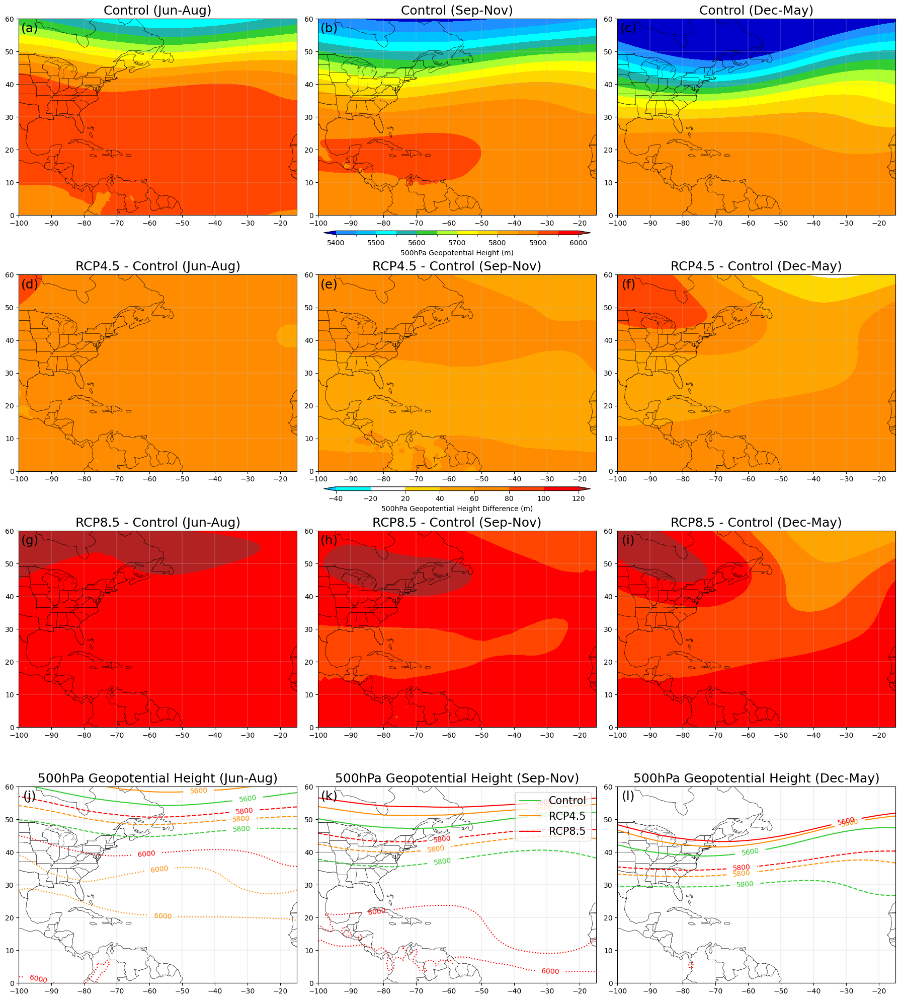

In [28]:
# Plot 500hPa Geopotential Height Differences
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May']
Var = 'Z3'
Plev = 50000
Bounds, Colours = Z_500hPa_Bounds, Z_500hPa_Colours
Diff_Bounds, Diff_Colours = Z_500hPa_Diff_Bounds, Z_500hPa_Diff_Colours
Line_Bounds = Z_500hPa_Lines_Bounds
Label, Label_Unit = '500hPa Geopotential Height', '(m)'
Diff_Plot = True
Ocean_Only = False
Savefig = True
Figname = 'Z_500hPa_Seasons_Diffs.png'
Variable_Contour_Plot(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Colours, Diff_Bounds, Diff_Colours, Line_Bounds, Label, Label_Unit, Diff_Plot, Ocean_Only, Savefig, Figname)

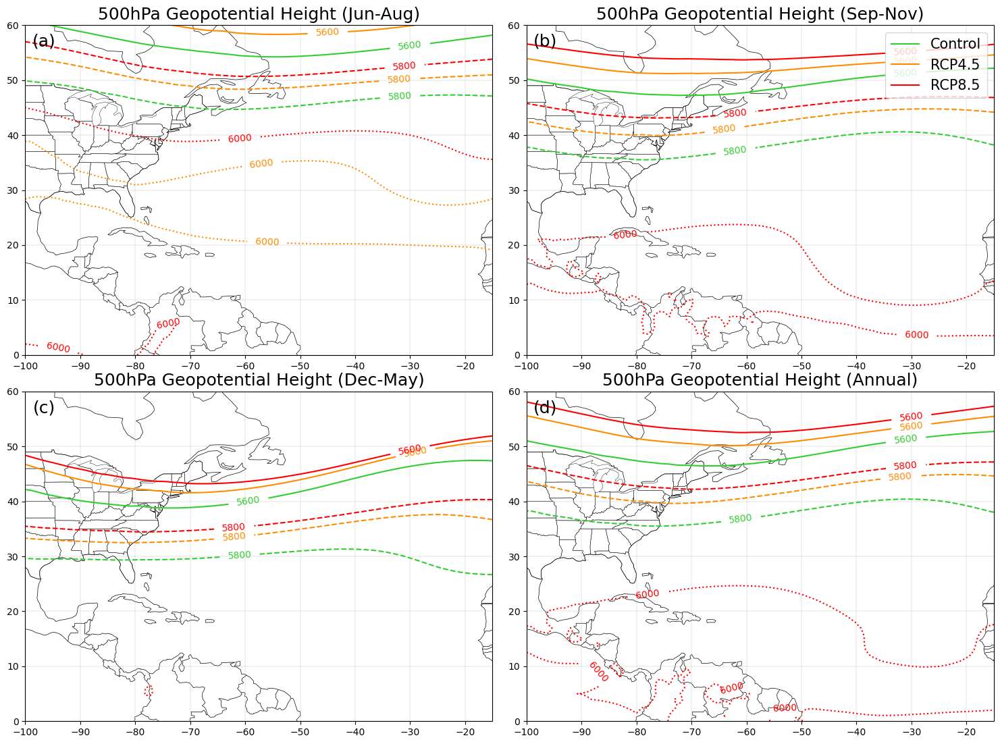

In [29]:
# Plot 500hPa Geopotential Height
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May', 'Annual']
Var = 'Z3'
Plev = 50000
Bounds = Z_500hPa_Lines_Bounds
Label = '500hPa Geopotential Height'
Ocean_Only = False
Savefig = True
Figname = 'Z_500hPa_Seasons_Lines.png'
Variable_Contour_Line(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Label, Ocean_Only, Savefig, Figname)

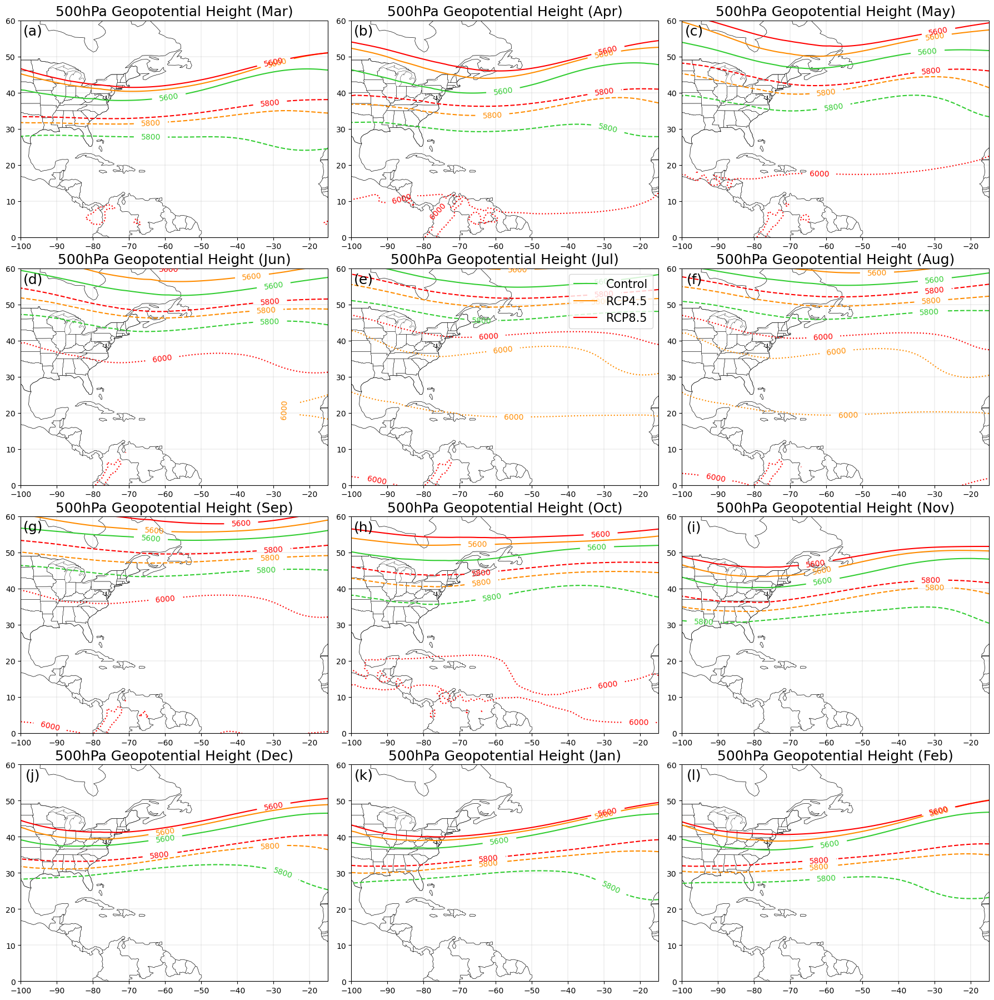

In [30]:
# Plot 500hPa Geopotential Height
Months = ['Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Jan', 'Feb']
Var = 'Z3'
Plev = 50000
Bounds = Z_500hPa_Lines_Bounds
Label = '500hPa Geopotential Height'
Ocean_Only = False
Savefig = True
Figname = 'Z_500hPa_Months_Lines.png'
Variable_Contour_Line(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Label, Ocean_Only, Savefig, Figname)

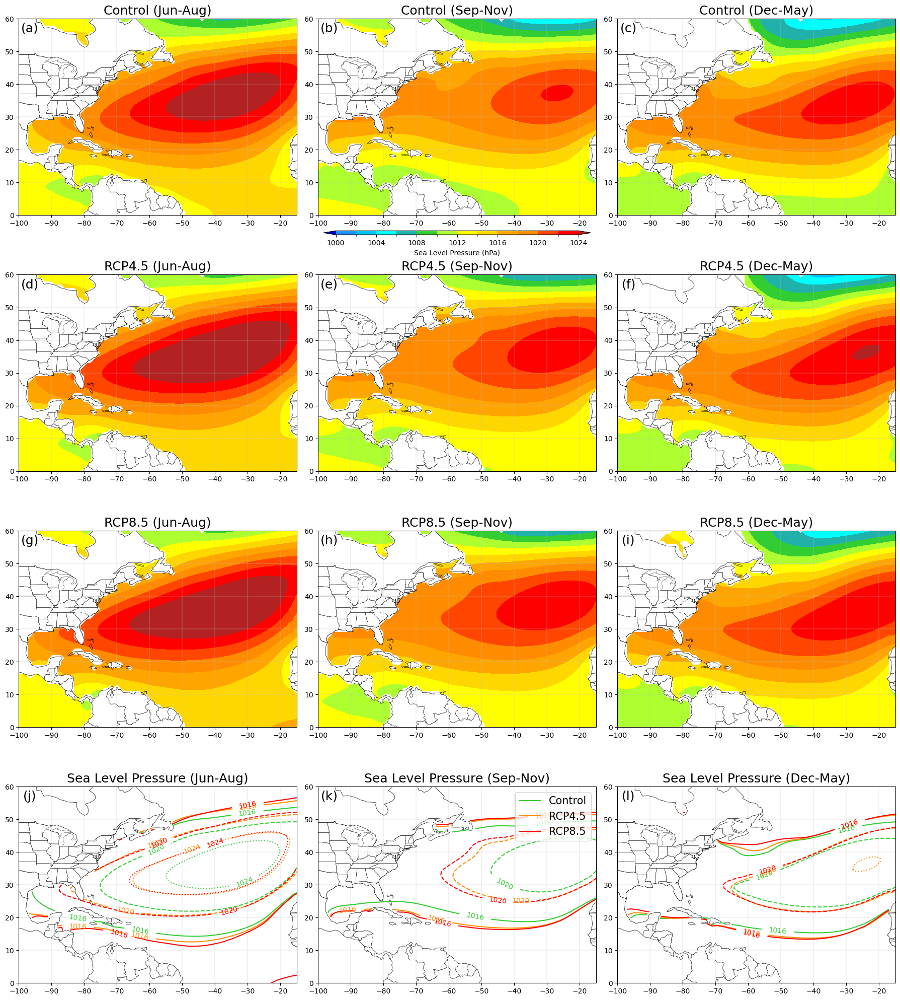

In [31]:
# Plot Sea Level Pressure
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May']
Var = 'PSL'
Plev = 100000
Bounds, Colours = SLP_Bounds, SLP_Colours
Diff_Bounds, Diff_Colours = SLP_Diff_Bounds, SLP_Diff_Colours
Line_Bounds = SLP_Lines_Bounds
Label, Label_Unit = 'Sea Level Pressure', '(hPa)'
Diff_Plot = False
Ocean_Only = True
Savefig = True
Figname = 'SLP_Seasons_Colours.png'
Variable_Contour_Plot(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Colours, Diff_Bounds, Diff_Colours, Line_Bounds, Label, Label_Unit, Diff_Plot, Ocean_Only, Savefig, Figname)

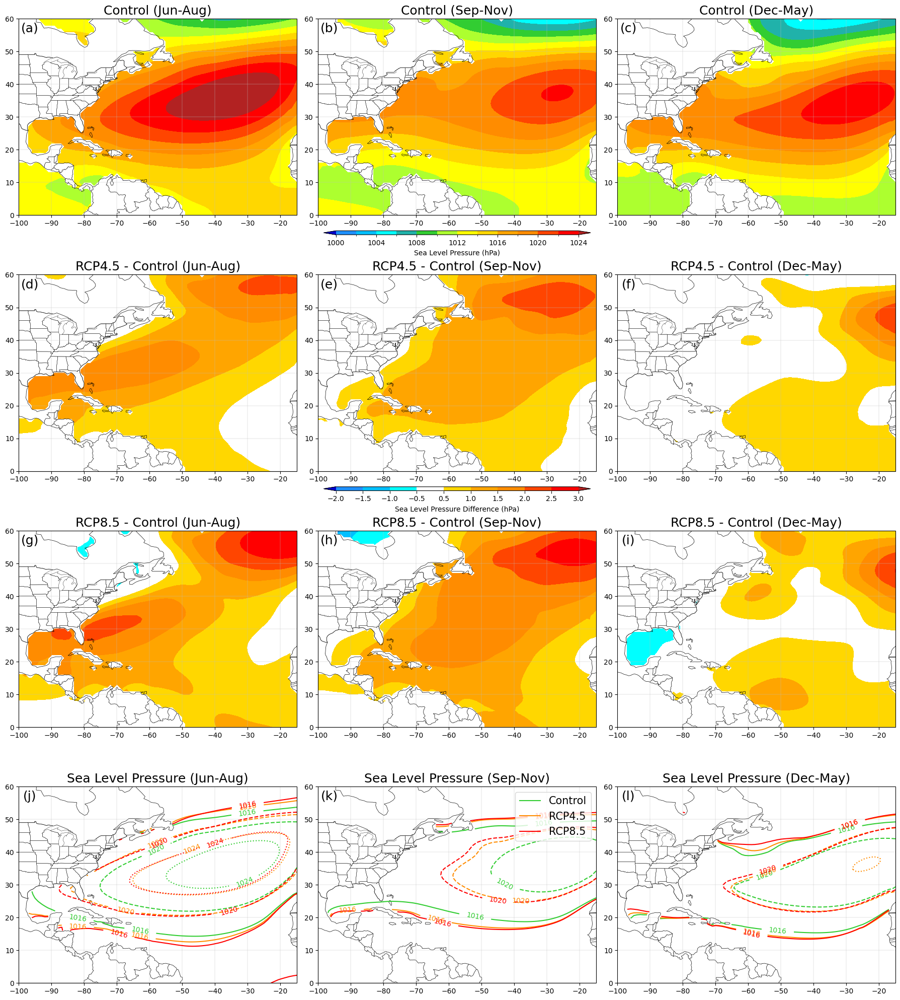

In [32]:
# Plot Sea Level Pressure Difference
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May']
Var = 'PSL'
Plev = 100000
Bounds, Colours = SLP_Bounds, SLP_Colours
Diff_Bounds, Diff_Colours = SLP_Diff_Bounds, SLP_Diff_Colours
Line_Bounds = SLP_Lines_Bounds
Label, Label_Unit = 'Sea Level Pressure', '(hPa)'
Diff_Plot = True
Ocean_Only = True
Savefig = True
Figname = 'SLP_Seasons_Diffs.png'
Variable_Contour_Plot(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Colours, Diff_Bounds, Diff_Colours, Line_Bounds, Label, Label_Unit, Diff_Plot, Ocean_Only, Savefig, Figname)

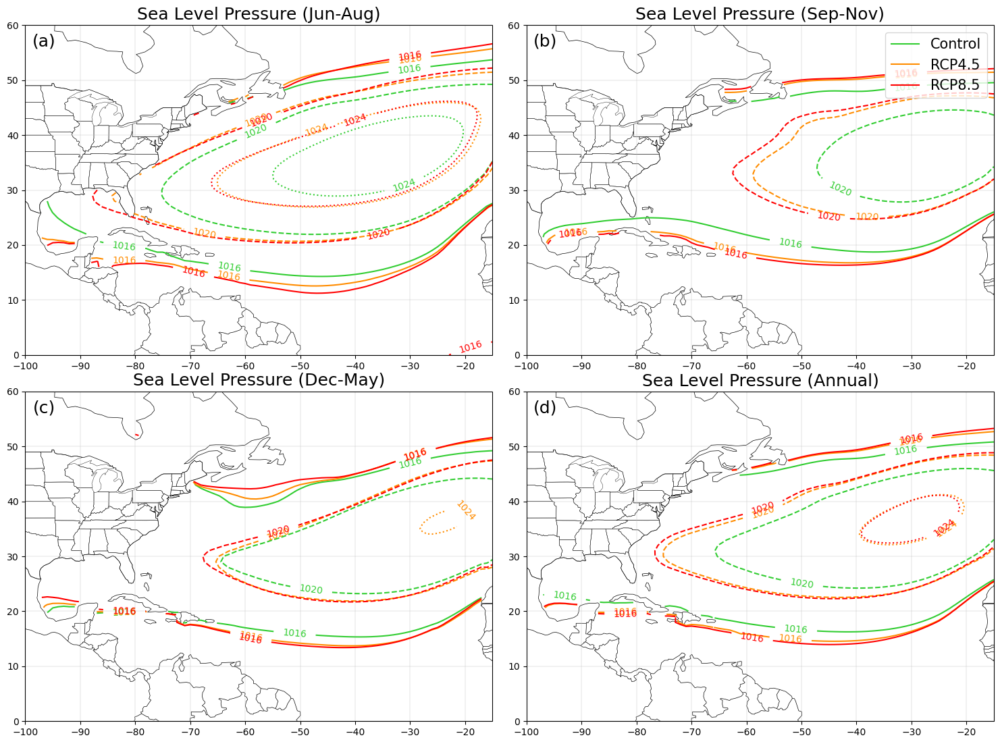

In [33]:
# Plot Sea Level Pressure
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May', 'Annual']
Var = 'PSL'
Plev = 100000
Bounds = SLP_Lines_Bounds
Label = 'Sea Level Pressure'
Ocean_Only = True
Savefig = True
Figname = 'SLP_Seasons_Lines.png'
Variable_Contour_Line(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Label, Ocean_Only, Savefig, Figname)

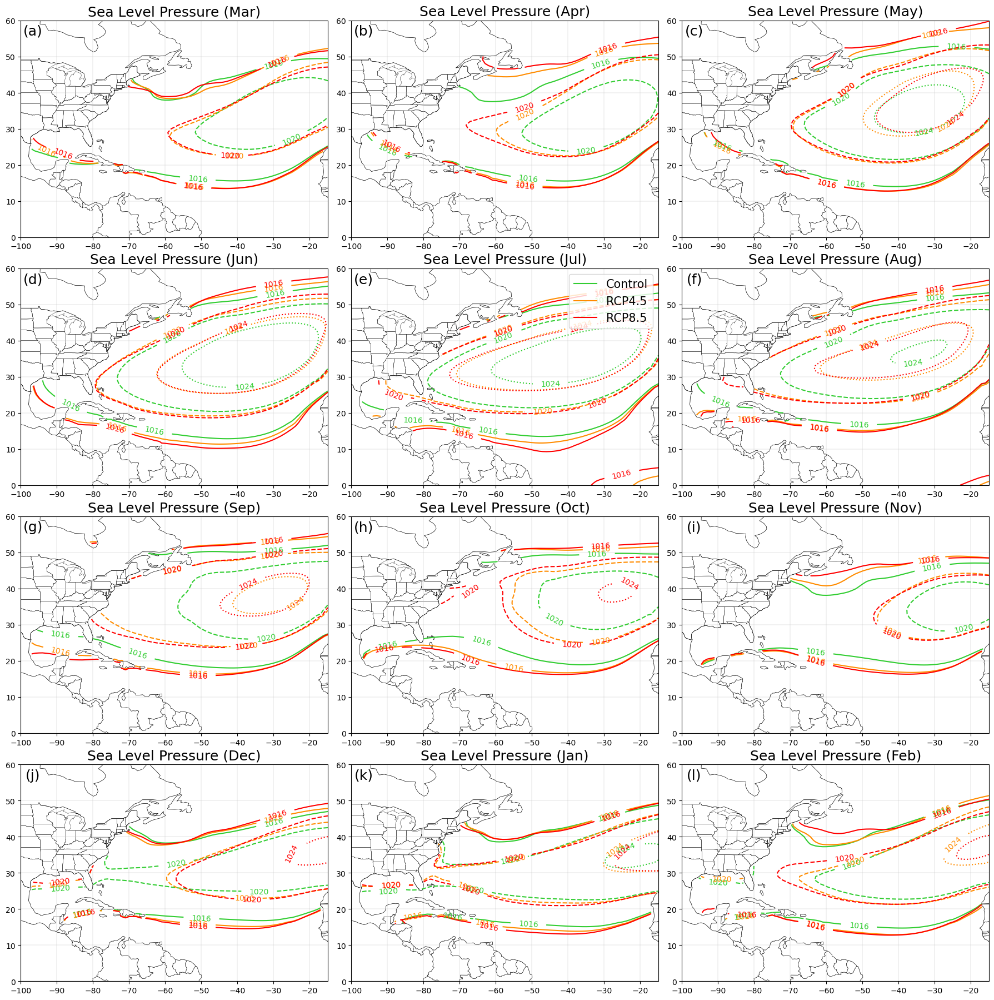

In [34]:
# Plot Sea Level Pressure
Months = ['Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Jan', 'Feb']
Var = 'PSL'
Plev = 100000
Bounds = SLP_Lines_Bounds
Label = 'Sea Level Pressure'
Ocean_Only = True
Savefig = True
Figname = 'SLP_Months_Lines.png'
Variable_Contour_Line(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Label, Ocean_Only, Savefig, Figname)

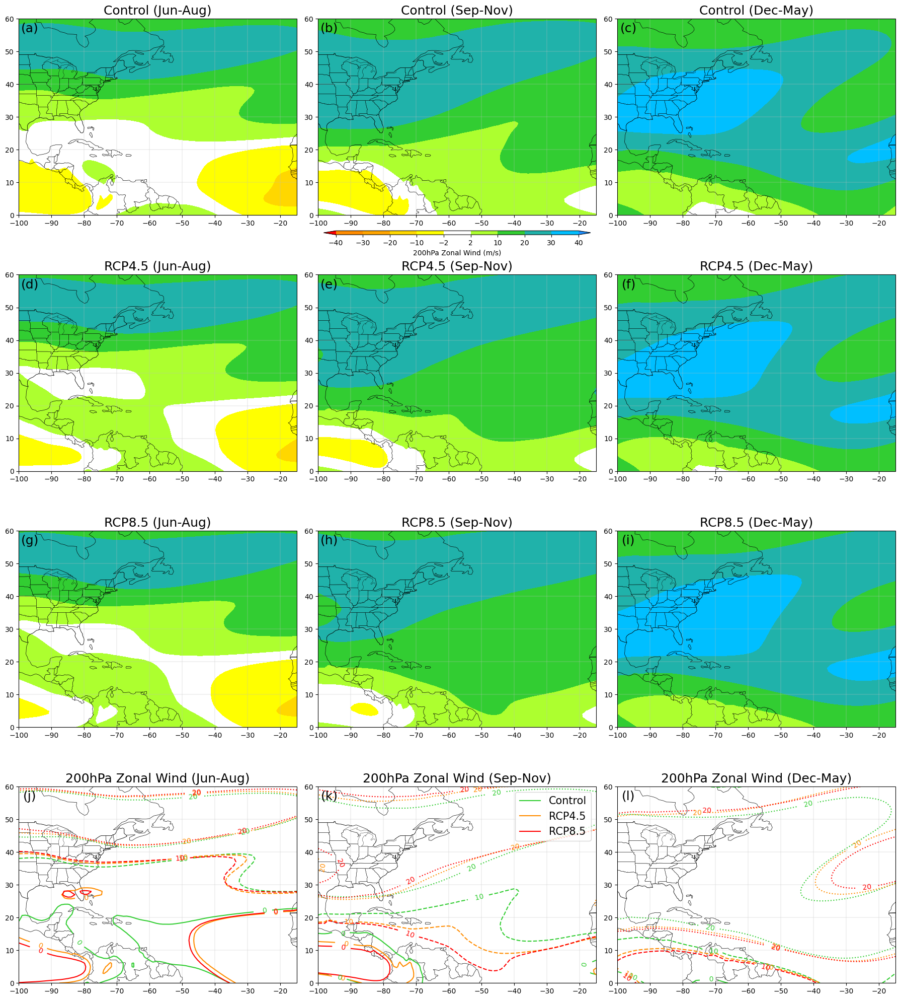

In [35]:
# Plot 200hPa Zonal Wind
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May']
Var = 'U'
Plev = 20000
Bounds, Colours = U_200hPa_Bounds, U_200hPa_Colours
Diff_Bounds, Diff_Colours = U_200hPa_Diff_Bounds, U_200hPa_Diff_Colours
Line_Bounds = U_200hPa_Lines_Bounds
Label, Label_Unit = '200hPa Zonal Wind', '(m/s)'
Diff_Plot = False
Ocean_Only = False
Savefig = True
Figname = 'U_200hPa_Seasons_Colours.png'
Variable_Contour_Plot(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Colours, Diff_Bounds, Diff_Colours, Line_Bounds, Label, Label_Unit, Diff_Plot, Ocean_Only, Savefig, Figname)

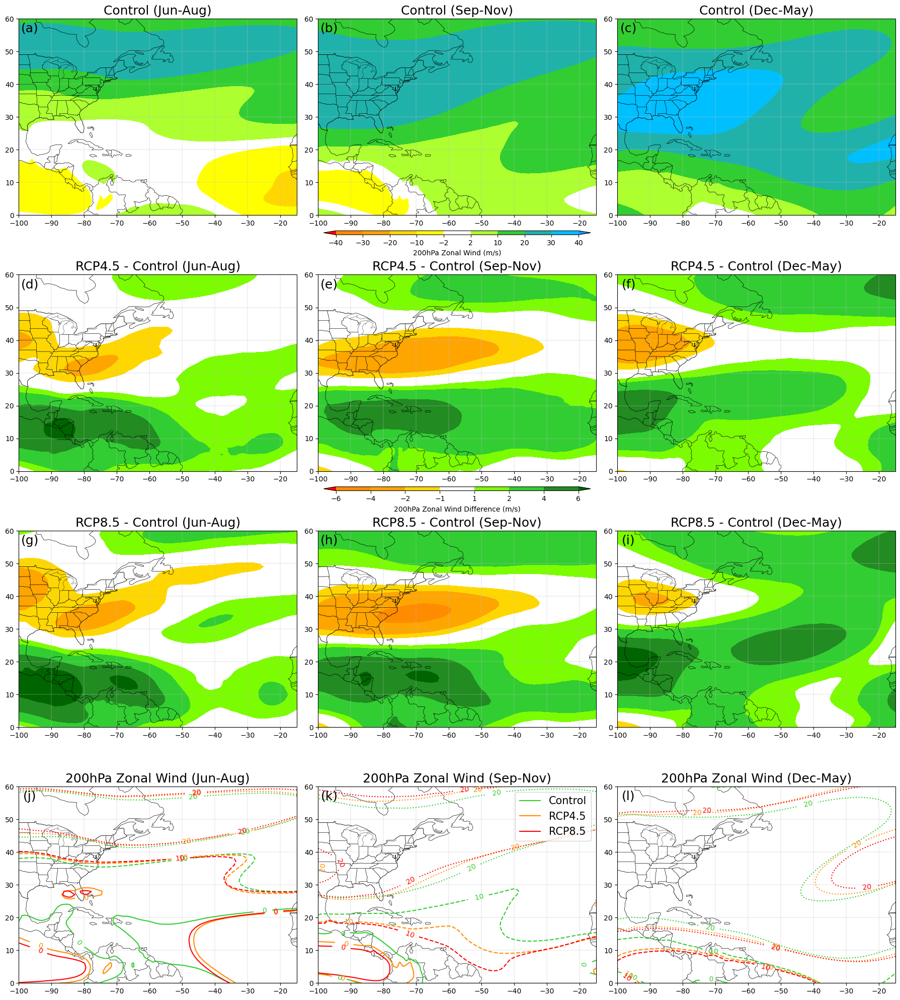

In [36]:
# Plot 200hPa Zonal Wind Difference
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May']
Var = 'U'
Plev = 20000
Bounds, Colours = U_200hPa_Bounds, U_200hPa_Colours
Diff_Bounds, Diff_Colours = U_200hPa_Diff_Bounds, U_200hPa_Diff_Colours
Line_Bounds = U_200hPa_Lines_Bounds
Label, Label_Unit = '200hPa Zonal Wind', '(m/s)'
Diff_Plot = True
Ocean_Only = False
Savefig = True
Figname = 'U_200hPa_Seasons_Diffs.png'
Variable_Contour_Plot(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Colours, Diff_Bounds, Diff_Colours, Line_Bounds, Label, Label_Unit, Diff_Plot, Ocean_Only, Savefig, Figname)

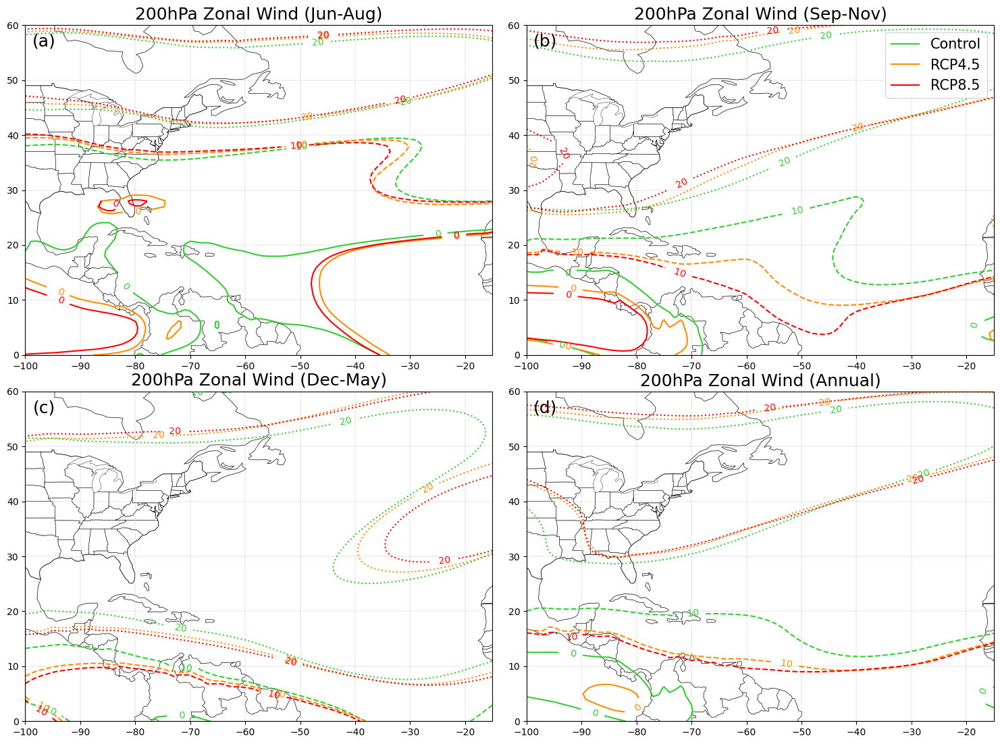

In [37]:
# Plot 200hPa Zonal Wind
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May', 'Annual']
Var = 'U'
Plev = 20000
Bounds = U_200hPa_Lines_Bounds
Label = '200hPa Zonal Wind'
Ocean_Only = False
Savefig = True
Figname = 'U_200hPa_Seasons_Lines.png'
Variable_Contour_Line(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Label, Ocean_Only, Savefig, Figname)

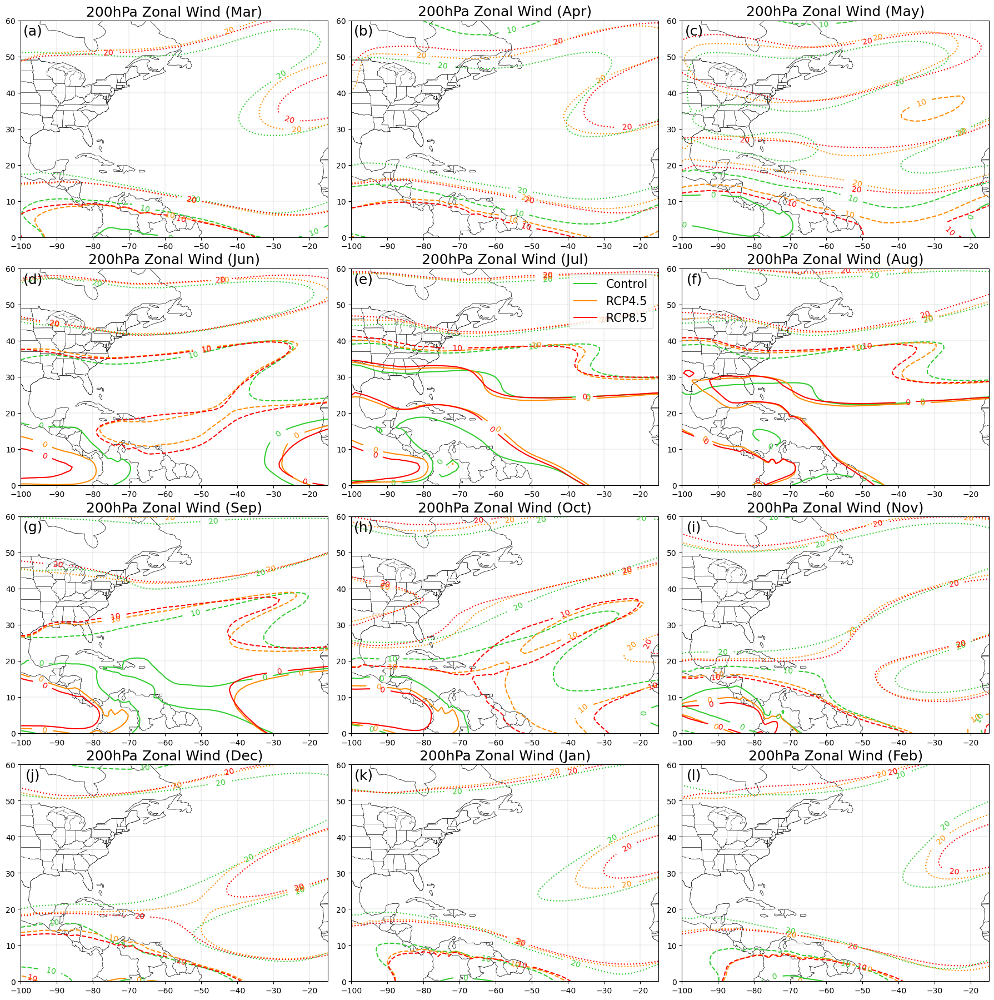

In [38]:
# Plot 200hPa Zonal Wind
Months = ['Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Jan', 'Feb']
Var = 'U'
Plev = 20000
Bounds = U_200hPa_Lines_Bounds
Label = '200hPa Zonal Wind'
Ocean_Only = False
Savefig = True
Figname = 'U_200hPa_Months_Lines.png'
Variable_Contour_Line(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Label, Ocean_Only, Savefig, Figname)

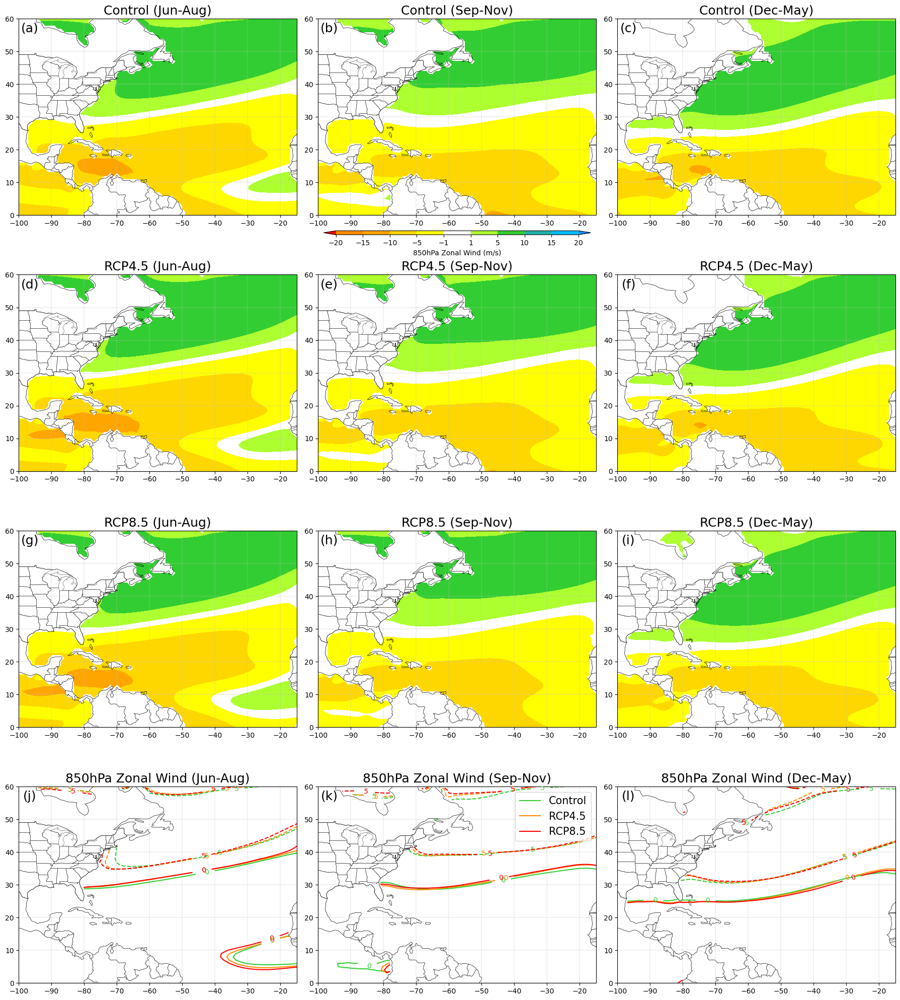

In [39]:
# Plot 850hPa Zonal Wind
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May']
Var = 'U'
Plev = 85000
Bounds, Colours = U_850hPa_Bounds, U_850hPa_Colours
Diff_Bounds, Diff_Colours = U_850hPa_Diff_Bounds, U_850hPa_Diff_Colours
Line_Bounds = U_850hPa_Lines_Bounds
Label, Label_Unit = '850hPa Zonal Wind', '(m/s)'
Diff_Plot = False
Ocean_Only = True
Savefig = True
Figname = 'U_850hPa_Seasons_Colours.png'
Variable_Contour_Plot(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Colours, Diff_Bounds, Diff_Colours, Line_Bounds, Label, Label_Unit, Diff_Plot, Ocean_Only, Savefig, Figname)

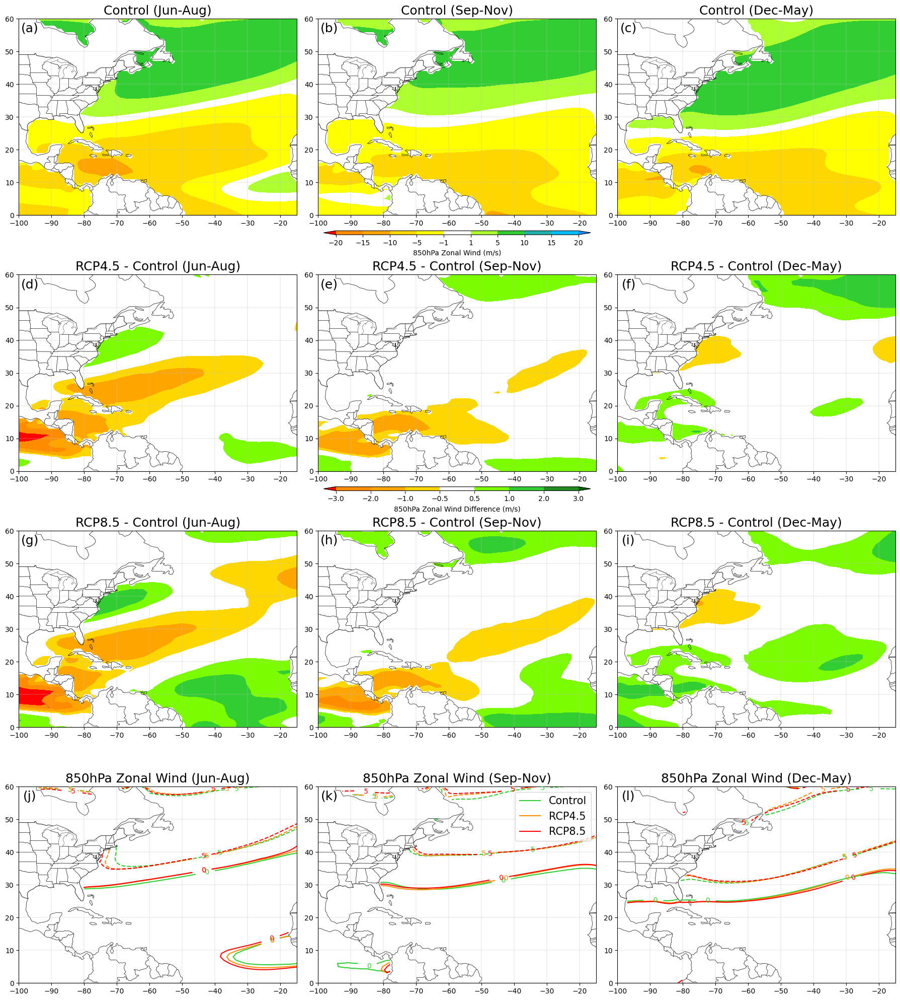

In [40]:
# Plot 850hPa Zonal Wind Difference
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May']
Var = 'U'
Plev = 85000
Bounds, Colours = U_850hPa_Bounds, U_850hPa_Colours
Diff_Bounds, Diff_Colours = U_850hPa_Diff_Bounds, U_850hPa_Diff_Colours
Line_Bounds = U_850hPa_Lines_Bounds
Label, Label_Unit = '850hPa Zonal Wind', '(m/s)'
Diff_Plot = True
Ocean_Only = True
Savefig = True
Figname = 'U_850hPa_Seasons_Diffs.png'
Variable_Contour_Plot(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Colours, Diff_Bounds, Diff_Colours, Line_Bounds, Label, Label_Unit, Diff_Plot, Ocean_Only, Savefig, Figname)

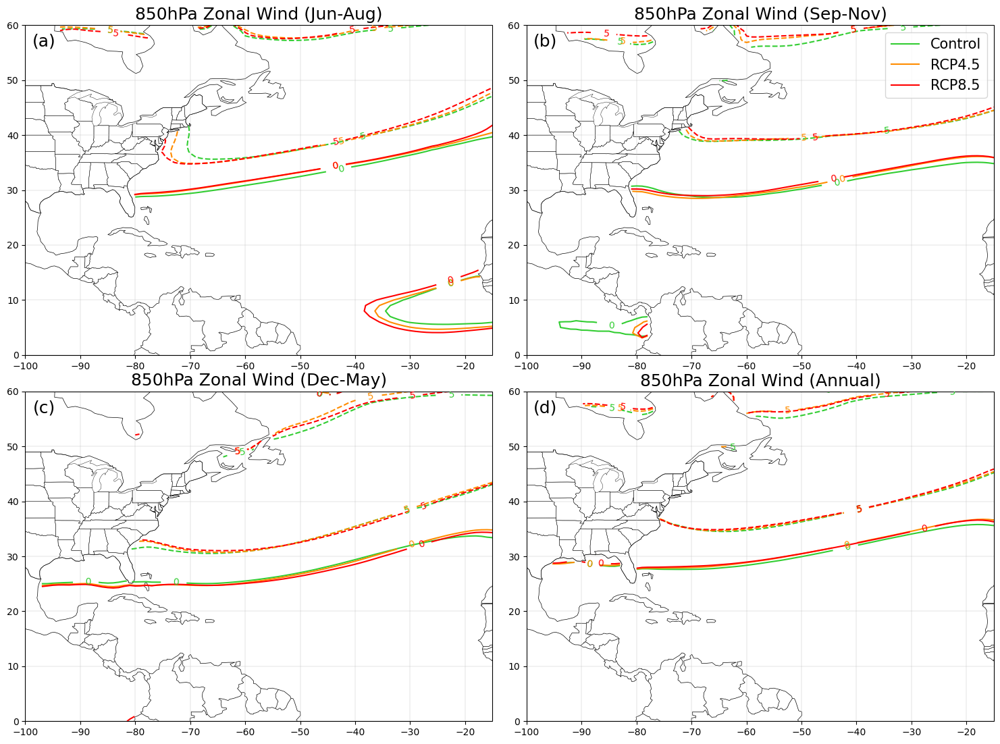

In [41]:
# Plot 850hPa Zonal Wind
Months = ['Jun-Aug', 'Sep-Nov', 'Dec-May', 'Annual']
Var = 'U'
Plev = 85000
Bounds = U_850hPa_Lines_Bounds
Label = '850hPa Zonal Wind'
Ocean_Only = True
Savefig = True
Figname = 'U_850hPa_Seasons_Lines.png'
Variable_Contour_Line(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Label, Ocean_Only, Savefig, Figname)

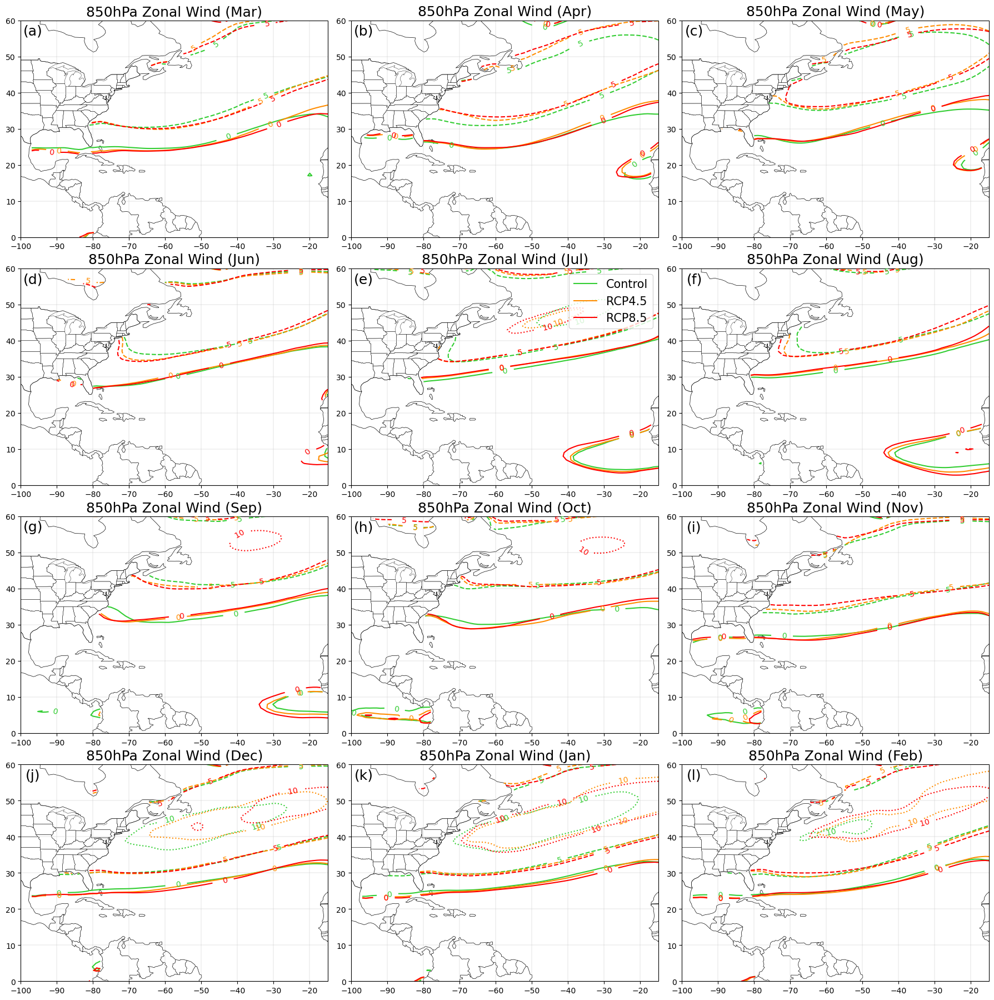

In [42]:
# Plot 850hPa Zonal Wind
Months = ['Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Jan', 'Feb']
Var = 'U'
Plev = 85000
Bounds = U_850hPa_Lines_Bounds
Label = '850hPa Zonal Wind'
Ocean_Only = True
Savefig = True
Figname = 'U_850hPa_Months_Lines.png'
Variable_Contour_Line(Control_DS_Dict, RCP45_DS_Dict, RCP85_DS_Dict, Months, Var, Plev, \
Bounds, Label, Ocean_Only, Savefig, Figname)

In [43]:
# Calculate Wind Shear (850hPa to 200hPa)